# Brain MRI segmentation: Data prep and EDA
In this project, we will train and deploy a model to automatically identify [lower-grade gliomas](https://www.ncbi.nlm.nih.gov/books/NBK560668/)(LGG) from brain MRI scans. Here we will be working with the [Brain MRI Segmentation](https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation) dataset from Kaggle. The GIF below shows data from an example patient in the dataset. On the left is the input brain MRI (three channel) image, while on the right is the manually labelled segmentation mask. Here white identicates FLAIR abnormality which indicates a tumour. Our objective is to build a deep learning model to automatically produce the sementation mask on the right, given the input MRI data. We will train and deploy a model using AWS Sagemaker.

<p align="center">
  <img src="./../imgs/TCGA_DU_7301_19911112_slices.gif" width=800/>
</p>

In this notebook we will prepare the dataset and perform exploratory data analysis to better understand the data that we're working with. We will complete the following tasks:
- Download the dataset from Kaggle
- Split the data into train, validation and test datasets
- Upload the datasets to an S3 bucket
- Login to Weights and Biases (optional)
- Perform EDA on dataset

## Setup

### Import packages
Now import the packages needed to run this notebook:

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
from random import randint
import sys

import git
from IPython.display import Image as DispImage
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from tqdm.auto import tqdm
import yaml

In [3]:
sys.path.append('./../')
from src.data import create_kaggle_token_file, setup_brain_mri_dataset, extract_patient_filepaths, extract_dataset_filepaths, upload_data_to_s3
from src.utils import generate_wandb_api_key
from src.visualize import (
    plot_patient_mri, plot_patient_mri_mask_overlay_monai, plot_patient_mri_mask_overlay, plot_patient_slice_channels, make_patient_data_gif
    )

### Import configuration file
The `config.yaml` file contains some import parameters that we will use throughout the notebook. For instance, it includes `DATA_ROOT_PATH`, which specifies where we will store the data locally. Currently this is set to `./../data` (i.e. a folder named `data` will be created inside the root of the repository), but you can choose a different location if you wish.

In [4]:
with open("./../config.yaml", "r") as f:
    config = yaml.load(f, Loader=yaml.FullLoader)
config

{'DATA_DIR': 'data',
 'DATA_ZIP_FILENAME': 'lgg-mri-segmentation.zip',
 'DUMMY_IAM_ROLE': 'arn:aws:iam::111111111111:role/service-role/AmazonSageMaker-ExecutionRole-20200101T000001',
 'KAGGLE_DATASET': 'mateuszbuda/lgg-mri-segmentation',
 'RUN_MODE': 'sagemaker',
 'S3_BUCKET_NAME': 'sagemaker-brain-mri'}

Now we need to determine the path of the Git project so we can specify the full data path. We can do this using the `Git` Python package.

In [ ]:
git_repo = git.Repo('.', search_parent_directories=True)
PROJECT_ROOT_PATH = git_repo.working_dir
DATA_ROOT_PATH = os.path.join(PROJECT_ROOT_PATH, config['DATA_DIR'])

In [6]:
DATA_ROOT_PATH

'/home/robsmith155/github/udacity-nd-aws-ml-engineer-final-project/data'

## Dataset
Here we will download the data from Kaggle. First we need to get your Kaggle API token.


### Retrieve Kaggle user token
To download the dataset using the [Kaggle CLI](https://github.com/Kaggle/kaggle-api) we need to create an API token. So that we don't need to recreate this everytime we want to interact with Kaggle, we can place it in a file located at `~/.kaggle/kaggle.json` (where `~` represents the users home directory). Here we can use the `create_kaggle_token_file` to create this file and make sure it has the correct permissions. 

Before running this you will need to login to your Kaggle account and create a new API token (if you don't already have one). 

1. Go to your Kaggle account

Sign into [Kaggle](https://www.kaggle.com/) and click on your profile picture (top right corner). Select `Account`.

<p align="center">
    <img src="./../imgs/create-kaggle-api1.png">
</p>

2. Create new API token

Now scroll down to the API section and click on `Create New API Token`.

<p align="center">
    <img src="./../imgs/create-kaggle-api2.png">
</p>


Now run the `create_kaggle_token_file` function below and enter your Kaggle user name and the token you just downloaded when prompted.

In [7]:
create_kaggle_token_file()

2022-08-18 12:11:50,806 Kaggle token file already created in /home/robsmith155/.kaggle/kaggle.json.


### Download data
Now we can download and extract the dataset from [Kaggle](https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation). In the `src.data` module I've put a function named `setup_brain_mri_dataset`. This will perform the following tasks:
- Download the dataset from Kaggle
- Extract the contents of the downloaded zip file
- Sort the data into train, val and test dataset folders

Note that the data downloaded from Kaggle has not been split into datasets for us. Therefore this was included in the setup function. Here I ran some tests beforehand to make sure that the split of positive and negative slices is approximately consistent between the datasets. We will reviist this in the EDA section of the notebook.

In [8]:
setup_brain_mri_dataset(data_root_path=DATA_ROOT_PATH)

2022-08-18 12:11:50,931 Data already downloaded from Kaggle. Skipping download.
2022-08-18 12:11:50,933 Training, validation and test datasets already prepared. Skipping step.


### Upload data to S3 bucket

Note that the data will take some time to upload. It doesn't seem like the functions I use from the `sagemaker` SDK have an option to include a progress bar.

**Note:** If you only want to run the training fully locally, then you can skip this step.

In [9]:

upload_data_to_s3(bucket_name=config['S3_BUCKET_NAME'], local_dataset_path=os.path.join(DATA_ROOT_PATH, 'brain-mri-dataset'))

2022-08-18 12:11:51,055 Found credentials in shared credentials file: ~/.aws/credentials
2022-08-18 12:11:58,509 Data already uploaded to s3://sagemaker-brain-mri/data. Skipping this step.


### Weights and Biases
The training functions provided in this repo are setup to enable tracking experiments in [Weights and Biases](https://wandb.ai/site). This is a great free (for personal projects) tool for experiment tracking and model management. If you want to use the W&B tracking (which is optional), you first need to go the website and create an account. Once you have an account and have logged in, run the cell below to login to Weights and Biases from this machine. This will ask you to copy your API key from https://wandb.ai/authorize.

**Note:** This will generate a `secret.env` file with your API key in the `sagemaker_src` folder (for things run on AWS SageMaker). This has been added to the `.gitignore` file so that the key is not commited and pushed to GitHub by mistake.

In [10]:
generate_wandb_api_key()

2022-08-18 12:11:58,666 Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: robsmith155. Use `wandb login --relogin` to force relogin
2022-08-18 12:12:00,530 INFO: Already logged into Weights and Biases...
2022-08-18 12:12:00,532 INFO: Weights and Biases secret API key saved to /home/robsmith155/github/udacity-nd-aws-ml-engineer-final-project/sagemaker_src/secrets.env


Now that the data has been downloaded and prepared we can run some initial analysis of the data.

## EDA
Before we start looking into training a model, let's investigate the data to identify any issues that we may need to take into consideration.

### Basic information
The information below is taken from the `README` file that was provided with the data and from a paper by [Buda et al. (2019)](https://arxiv.org/pdf/1906.03720.pdf):

This dataset contains brain MRI images together with manual FLAIR abnormality segmentation masks obtained from [The Cancer Imaging Archive (TCIA)](https://www.cancerimagingarchive.net/). They correspond to 110 patients (from five different institutions) included in [The Cancer Genome Atlas (TCGA)](https://www.cancer.gov/about-nci/organization/ccg/research/structural-genomics/tcga) lower-grade glioma collection with at least fluid-attenuated inversion recovery (FLAIR) sequence and genomic cluster data available. The MRI scans only include pre-operative data to capture the pattern of the original tumour growth.

All images are provided in `.tif` format with 3 channels per image. For 101 cases, 3 sequences are available, i.e. pre-contrast, FLAIR, post-contrast (in this order of channels). For 9 cases, post-contrast sequence is missing and for 6 cases, pre-contrast sequence is missing. Missing sequences are replaced with FLAIR sequence to make all images 3-channel.

Masks are binary, 1-channel images. They segment FLAIR abnormality present in the FLAIR sequence (available for all cases). The masks were manually created by a medical school graduate by drawing the outline of FLAIR abnormality on the FLAIR channel. An experienced radiologist verified these segmentation masks and made modifications when necessary.

The dataset is organized into 110 folders named after case ID that contains information about source institution. Each folder contains MRI images with the following naming convention:

`TCGA_<institution-code>_<patient-id>_<slice-number>.tif`

Corresponding masks have a `_mask` suffix.

### Dataset folders

We will start by confirming the information provided above. First let's check the number of patients we have in the three datasets. Note that the downloaded data was split into three datasets (train, val, test) in the previous section.

In [11]:
train_patient_folders = [f.path for f in os.scandir(os.path.join(DATA_ROOT_PATH, 'brain-mri-dataset/train')) if f.is_dir()]
val_patient_folders = [f.path for f in os.scandir(os.path.join(DATA_ROOT_PATH, 'brain-mri-dataset/val')) if f.is_dir()]
test_patient_folders = [f.path for f in os.scandir(os.path.join(DATA_ROOT_PATH, 'brain-mri-dataset/test')) if f.is_dir()]

In [12]:
print(f'Number of patients in training dataset: {len(train_patient_folders)}')
print(f'Number of patients in validation dataset: {len(val_patient_folders)}')
print(f'Number of patients in test dataset: {len(test_patient_folders)}')

Number of patients in training dataset: 88
Number of patients in validation dataset: 11
Number of patients in test dataset: 11


This confirms that we have a total of 110 patients in the dataset. Note that due to the small dataset, I decided to keep 20% of the data for validation and testing, split evenly between the two.

### Patient folder contents

Let's look at the contents of the first patient in the training dataset.

In [13]:
os.listdir(train_patient_folders[0])

['TCGA_DU_7301_19911112_26_mask.tif',
 'TCGA_DU_7301_19911112_19_mask.tif',
 'TCGA_DU_7301_19911112_13.tif',
 'TCGA_DU_7301_19911112_14.tif',
 'TCGA_DU_7301_19911112_4_mask.tif',
 'TCGA_DU_7301_19911112_23_mask.tif',
 'TCGA_DU_7301_19911112_9.tif',
 'TCGA_DU_7301_19911112_6.tif',
 'TCGA_DU_7301_19911112_5.tif',
 'TCGA_DU_7301_19911112_8.tif',
 'TCGA_DU_7301_19911112_10.tif',
 'TCGA_DU_7301_19911112_12_mask.tif',
 'TCGA_DU_7301_19911112_22_mask.tif',
 'TCGA_DU_7301_19911112_13_mask.tif',
 'TCGA_DU_7301_19911112_21_mask.tif',
 'TCGA_DU_7301_19911112_28.tif',
 'TCGA_DU_7301_19911112_31.tif',
 'TCGA_DU_7301_19911112_17.tif',
 'TCGA_DU_7301_19911112_14_mask.tif',
 'TCGA_DU_7301_19911112_33_mask.tif',
 'TCGA_DU_7301_19911112_27.tif',
 'TCGA_DU_7301_19911112_24.tif',
 'TCGA_DU_7301_19911112_31_mask.tif',
 'TCGA_DU_7301_19911112_5_mask.tif',
 'TCGA_DU_7301_19911112_7.tif',
 'TCGA_DU_7301_19911112_3.tif',
 'TCGA_DU_7301_19911112_2_mask.tif',
 'TCGA_DU_7301_19911112_2.tif',
 'TCGA_DU_7301_199111

We can see that we have many `.tif` files, with each image having a corresponding mask image. For training, we will make use of the [MONAI](https://monai.io/) Python package which is an open-source framework for building models with medical datasets. As we will see, this has the option to pass in data samples as dictionaries, which includes the path to the input image and corresponding mask as key-value pairs. In the `src/data` module I included a function named `extract_patient_filepaths` which will extract these dictionaries for us. I use this for the first training patient below:

In [14]:
train_files_patient_1 = extract_patient_filepaths(train_patient_folders[0])

In [15]:
len(train_files_patient_1)

35

In [16]:
train_files_patient_1[0:5]

[{'image': '/home/robsmith155/github/udacity-nd-aws-ml-engineer-final-project/data/brain-mri-dataset/train/TCGA_DU_7301_19911112/TCGA_DU_7301_19911112_1.tif',
  'mask': '/home/robsmith155/github/udacity-nd-aws-ml-engineer-final-project/data/brain-mri-dataset/train/TCGA_DU_7301_19911112/TCGA_DU_7301_19911112_1_mask.tif'},
 {'image': '/home/robsmith155/github/udacity-nd-aws-ml-engineer-final-project/data/brain-mri-dataset/train/TCGA_DU_7301_19911112/TCGA_DU_7301_19911112_2.tif',
  'mask': '/home/robsmith155/github/udacity-nd-aws-ml-engineer-final-project/data/brain-mri-dataset/train/TCGA_DU_7301_19911112/TCGA_DU_7301_19911112_2_mask.tif'},
 {'image': '/home/robsmith155/github/udacity-nd-aws-ml-engineer-final-project/data/brain-mri-dataset/train/TCGA_DU_7301_19911112/TCGA_DU_7301_19911112_3.tif',
  'mask': '/home/robsmith155/github/udacity-nd-aws-ml-engineer-final-project/data/brain-mri-dataset/train/TCGA_DU_7301_19911112/TCGA_DU_7301_19911112_3_mask.tif'},
 {'image': '/home/robsmith155/g

### Plot patient data

#### MRI slices
Now let's plot some of the data to see what we are working with. Each patient contains multiple image files which are 2D slices through the original 3D MRI volume. I added a number of plotting functions to the `src/visualize` module. The `plot_patient_mri` function will plot each MRI slice from a patient folder. Note that the MRI images contain three channels (pre-constrast, FLAIR, post-contrast) and are stacked like an RGB image in the slices below.

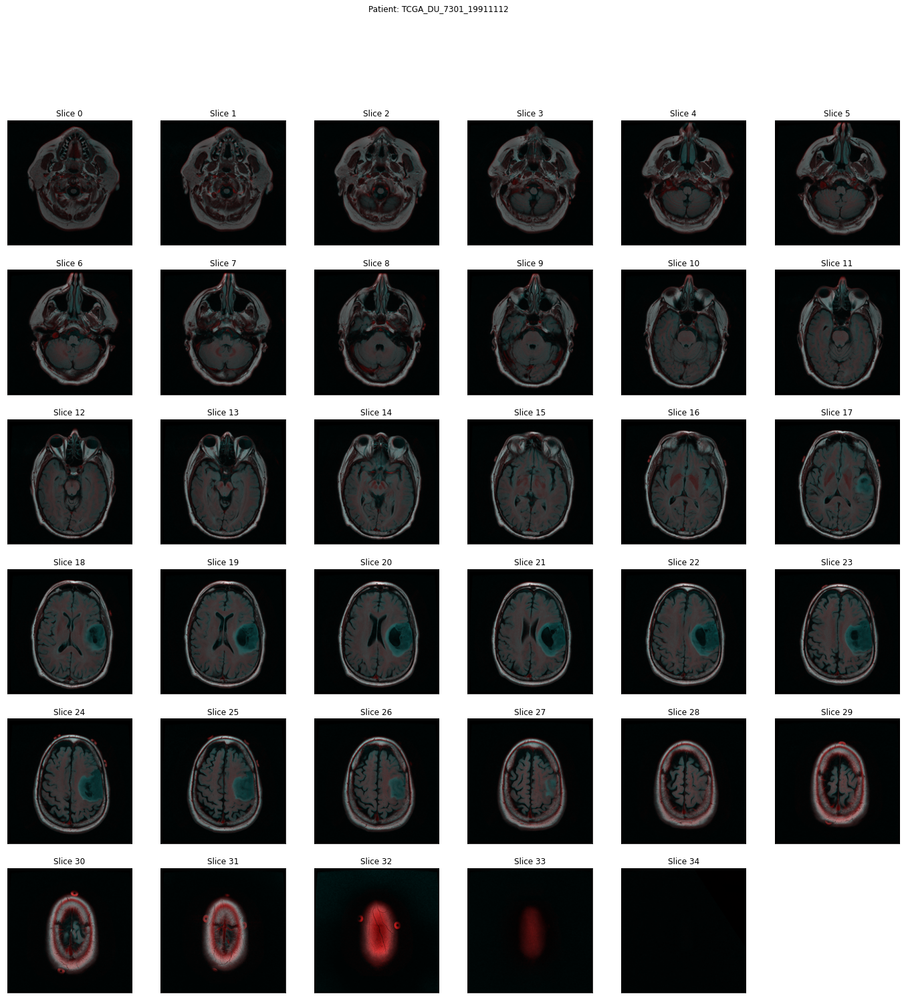

In [17]:
plot_patient_mri(patient_data_path=train_patient_folders[0])

One thing to note here is that some slices are very similar, since they come from the same patient (e.g. slices 18-20 above). This is why I decided to make sure that all of the data from one patient is in one dataset (e.g. only in the training data). Many people on Kaggle extract all the images from all patients and then randomly split the data, but I believe that this results in data leakage.

#### MRI slices with segmentation mask overlay

Now let's plot the same patient data, but this time we will overlay the segmentation mask on top. In the images below, the positive mask values (i.e. indicating FLAIR abnormalities) are shown in red.

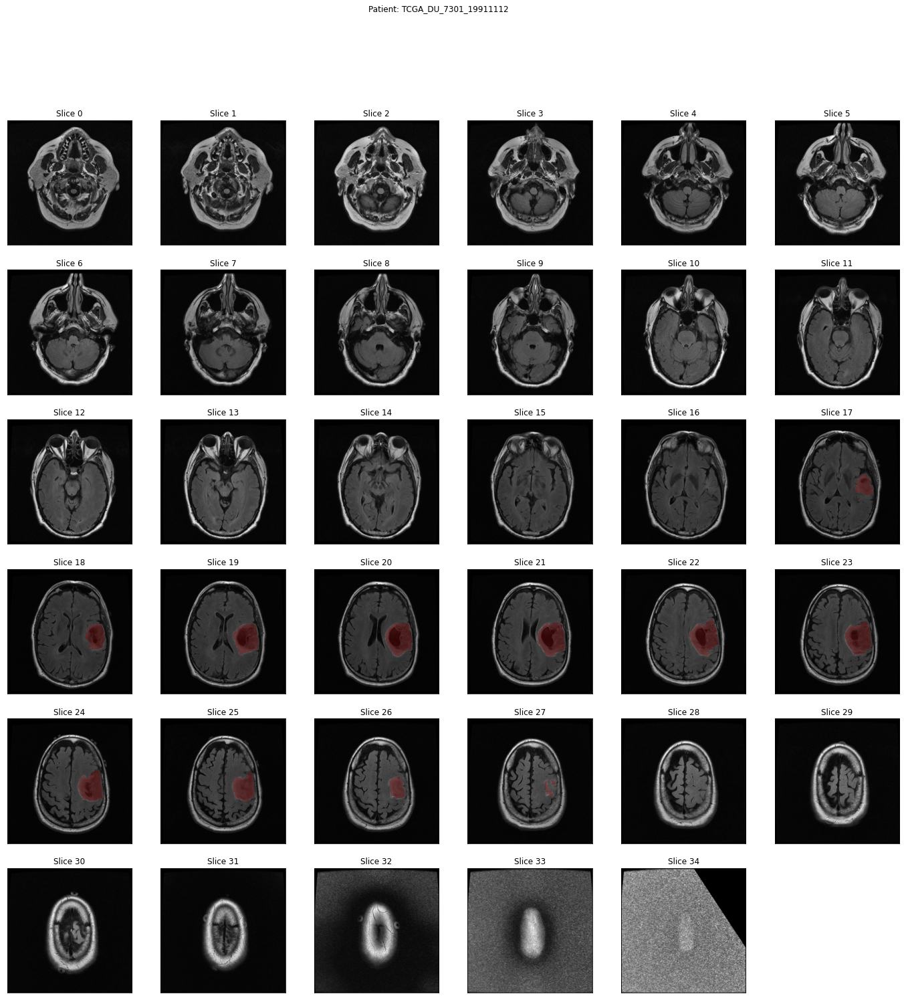

In [18]:
plot_patient_mri_mask_overlay(train_patient_folders[0])

An important note to make here is that not every slice has any positive mask labels. In fact, most are 100% the negative class. This means that we have an imbalanced dataset which we need to consider during model training.

The data for several more patients is plotted below:

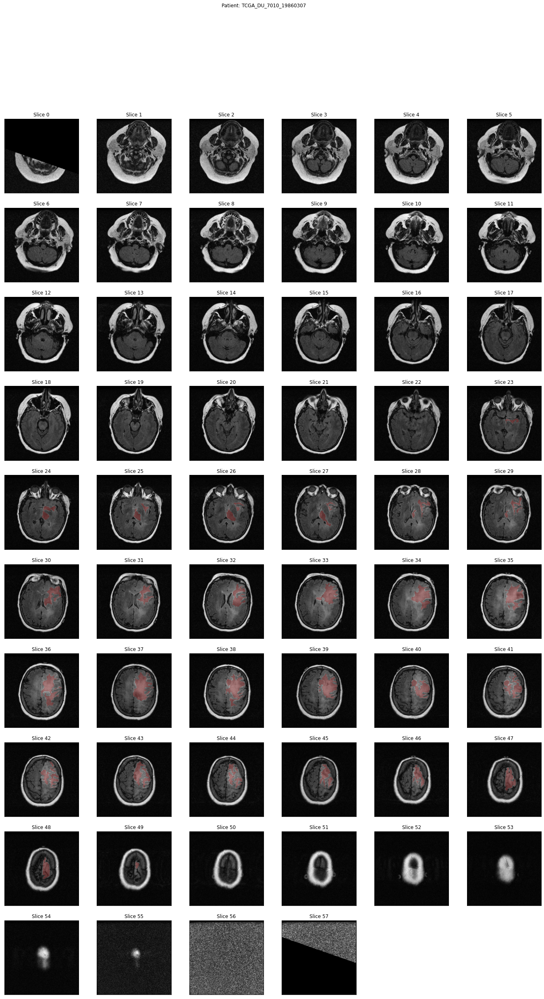

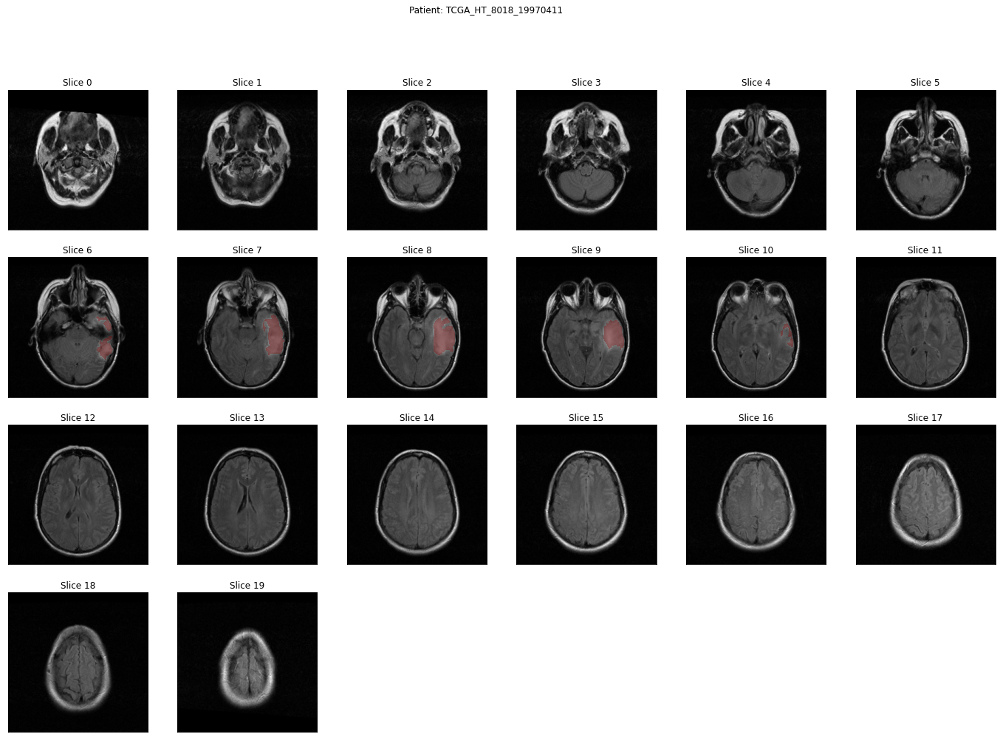

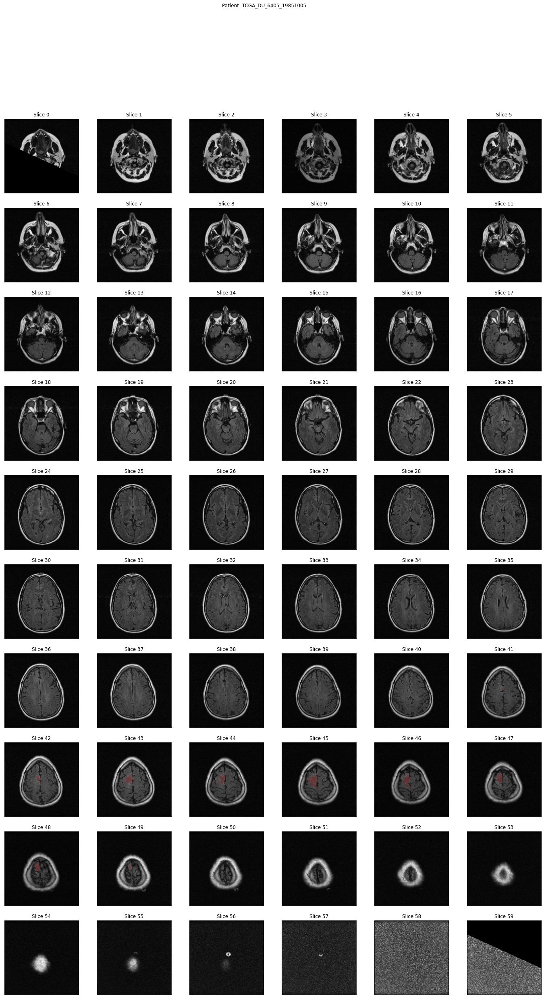

In [19]:
num_plots = 3

for i in range(num_plots):
    patient_idx = randint(0, len(train_patient_folders)-1)

    plot_patient_mri_mask_overlay(train_patient_folders[patient_idx])


#### Plot separate channels

The `plot_patient_slice_channels` function from the `visualize` module can be used to plot the three input channels separately. A few slices for the first training patient are shown below. Also included is the segmentation mask overlaid on top of the FLAIR channel.

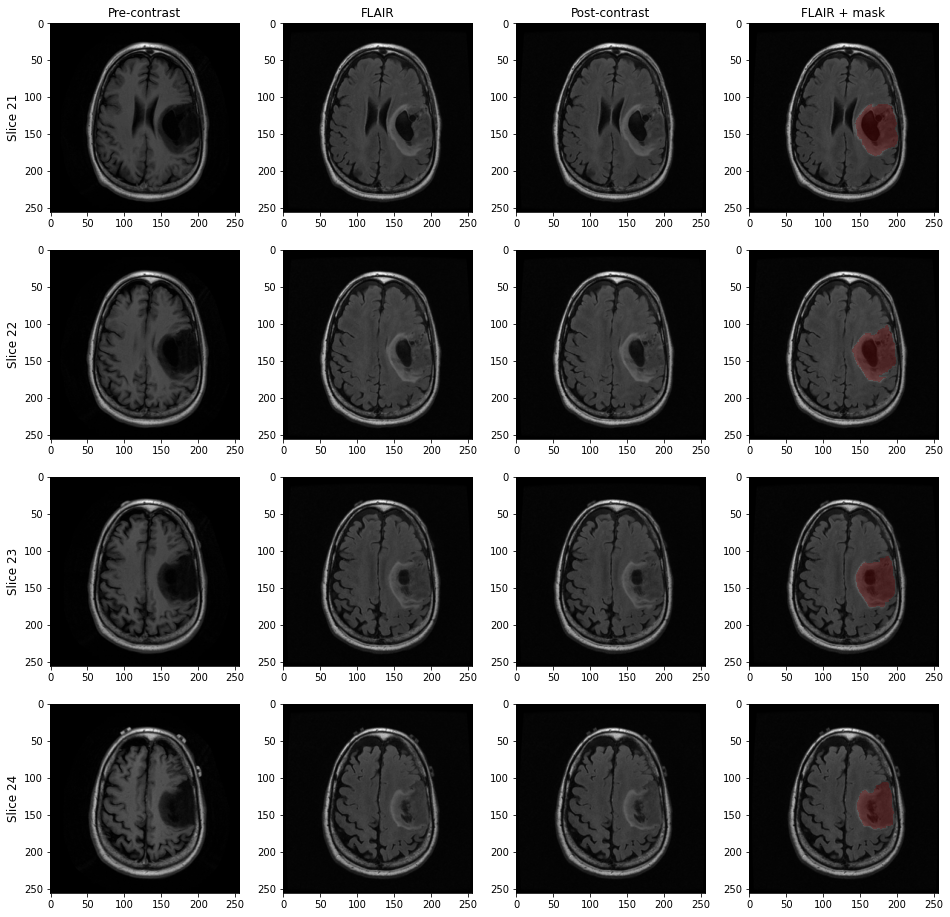

In [20]:
plot_patient_slice_channels(patient_data_path=train_patient_folders[0], slice_idxs=[21, 22, 23, 24])

Note that in the data README file, we were told that the ordering of the MRI channels is pre-contrast, FLAIR and pos-contrast. However, looking at the example above, it looks more like FLAIR is in the first channel. We're told that the segmentation masks were picked using FLAIR, so I'm not sure the ordering they gave us is correct. In any case, it doesn't affect how we're going to train the model, but it's something that I'm not sure about.

#### Make patient data GIF

I also included a function for making GIFs from a patient dataset (`make_patient_data_gif`). A few examples are shown below.

In [21]:
make_patient_data_gif(patient_dir_path=train_patient_folders[0])

GIF file output to ./TCGA_DU_7301_19911112_slices.gif.


In [22]:
make_patient_data_gif(patient_dir_path=train_patient_folders[1])

GIF file output to ./TCGA_HT_A61B_19991127_slices.gif.


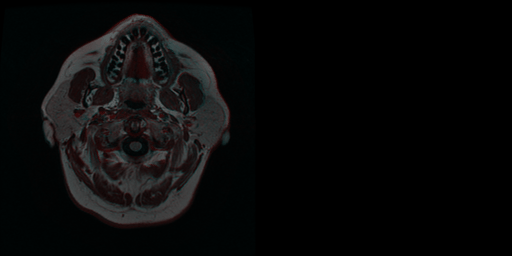

In [23]:
DispImage(open('./TCGA_DU_7301_19911112_slices.gif', 'rb').read())

### Dataset statistics

#### Number of examples
First we check the number of examples that we have in each dataset.

In [24]:
train_files = extract_dataset_filepaths(train_patient_folders)
val_files = extract_dataset_filepaths(val_patient_folders)
test_files = extract_dataset_filepaths(test_patient_folders)

In [25]:
print(f'Total number of training examples: {len(train_files)}')
print(f'Total number of validation examples: {len(val_files)}')
print(f'Total number of test examples: {len(test_files)}')

Total number of training examples: 3236
Total number of validation examples: 359
Total number of test examples: 334


We only have 3236 samples available for training, which is a very small dataset. We will need to condider things like data augmentation to help our model to generalize to data it hasn't seen before.

#### Number of slices containing positive segmentation label
Now we will check the proportion of mask slices that have positive (i.e. FLAIR abnormality indicating a tumour) pixel labels. Ideally we want to have the same split in each of the three datasets.

The function below will open a mask file and return a label of 1 if it contains positive pixel labels, and zero if the entire mask is the background (negative) class.

In [26]:
def mask_label(mask_path):
    im = Image.open(mask_path)
    im = np.array(im)
    max_value = max(im.flatten())
    if max_value > 0:
        label = 1
    else:
        label = 0   
    return label

Now we can use this to compute the number of slices containing FLAIR abnormalities.

In [27]:
train_file_labels = [mask_label(file['mask']) for file in train_files]
val_file_labels = [mask_label(file['mask']) for file in val_files]
test_file_labels = [mask_label(file['mask']) for file in test_files]

Now plot this in a horizontal bar chart to view the proportions:

Text(0.5, 1.0, 'Proportion of normal-tumour images for each dataset')

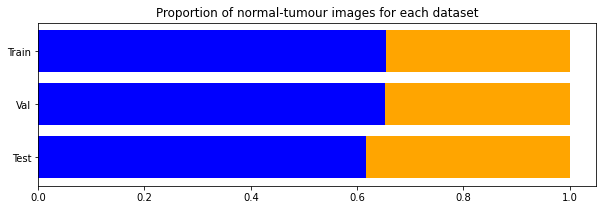

In [28]:
fig = plt.figure(figsize=(10,3))

plt.barh('Test', width = (len(test_file_labels) - sum(test_file_labels)) / len(test_file_labels), color='b')
plt.barh('Test', width = sum(test_file_labels) / len(test_file_labels), color='orange', left = (len(test_file_labels) - sum(test_file_labels)) / len(test_file_labels))
plt.barh('Val', width = (len(val_file_labels) - sum(val_file_labels)) / len(val_file_labels), color='b')
plt.barh('Val', width = sum(val_file_labels) / len(val_file_labels), color='orange', left = (len(val_file_labels) - sum(val_file_labels)) / len(val_file_labels))
plt.barh('Train', width = (len(train_file_labels) - sum(train_file_labels)) / len(train_file_labels), color='b')
plt.barh('Train', width = sum(train_file_labels) / len(train_file_labels), color='orange', left = (len(train_file_labels) - sum(train_file_labels)) / len(train_file_labels))
plt.title('Proportion of normal-tumour images for each dataset')

Here the blue bar represents the proportion of mask slices that have 100% negetive labels. We can see this is around 65% for the train and val datasets, but slightly lower for the test dataset. Ideally they would all be exactly the same, but this is difficult to achieve due to the way I'm splitting the data (i.e. keeping all data from one patient in a single dataset).

This means that only around 35% of the slices contain FLAIR abnormalities. Even the slices that do still only have a small percentage of pixels that are positive, so we have an imbalanced dataset. This is another consideration for the model training section.

### Image statistics
Now we'll take a look at the image statistics to see if there is anything we should be aware of.

#### Individual image stats
First let's compute the statistics on each image in the training dataset.

In [29]:
def image_stats(img_path):
    im = Image.open(img_path)
    im = np.array(im)
    mean = im.mean(axis=(0,1))
    std = im.std(axis=(0,1))
    max = np.amax(im, axis=(0,1))
    min = np.min(im, axis=(0,1))
    return mean, std, min, max

In [30]:
all_means = []
all_std = []
all_min = []
all_max = []

for file in tqdm(train_files):
    mean, std, min, max = image_stats(file['image'])
    all_means.append(mean)
    all_std.append(std)
    all_min.append(min)
    all_max.append(max)

  0%|          | 0/3236 [00:00<?, ?it/s]

These values are plotted as histograms below by channel and statistic.

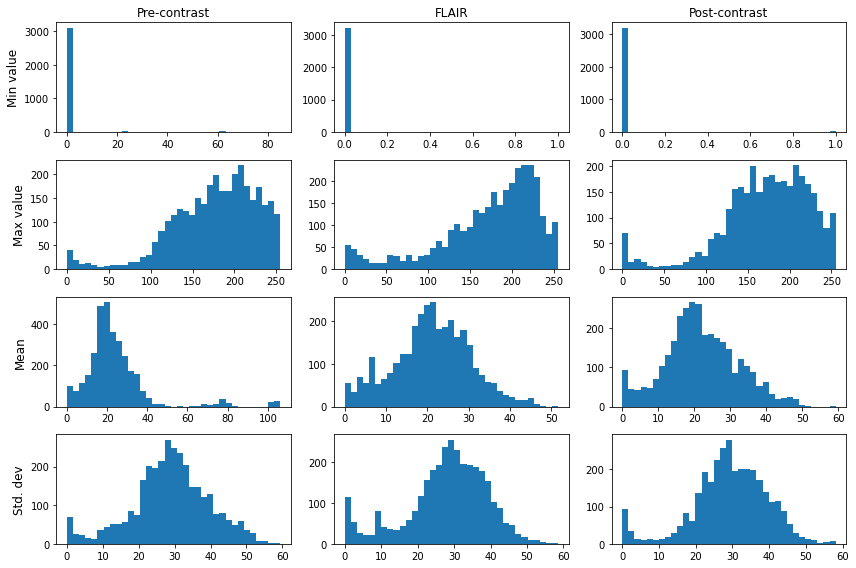

In [31]:
col_names = ['Pre-contrast', 'FLAIR', 'Post-contrast']
row_names = ['Min value', 'Max value', 'Mean', 'Std. dev']

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(12, 8))

for ax, col in zip(axes[0], col_names):
    ax.set_title(col)

for ax, row in zip(axes[:,0], row_names):
    ax.set_ylabel(row, rotation=90, size='large')

for i, data in enumerate([all_min, all_max, all_means, all_std]):
    for j in range(3):
        axes[i,j].hist(np.array(data)[:,j], bins=35)

fig.tight_layout()
plt.show()

A few comments from this plot:
- **Min value:** The minimum value is generally zero. However, a small number of pre-contrast and post-contrast images have larger minimum values.
- **Max value:** Some of the images appear to have a maximum value of 0, meaning they are just blank slices.
- **Mean:** The mean generally lies in the range of 10-30 for most of the images. The mean is kept low by the black pixels that surround the brain MRI scan.

The average channel mean and standard deviation are computed in the next cell. While this is okay for the dataset mean, it is not accurate for the standard deviation, as is shown in the next section.

In [32]:
channel_means = np.array([np.array(all_means)[:,0].mean(), np.array(all_means)[:,1].mean(), np.array(all_means)[:,2].mean()])
channel_std = np.array([np.array(all_std)[:,0].mean(), np.array(all_std)[:,1].mean(), np.array(all_std)[:,2].mean()])

In [33]:
channel_means, channel_std

(array([23.80525818, 21.11553853, 22.05294544]),
 array([28.8620636 , 27.94219044, 29.25629783]))

#### Dataset stats

The training data statistics are required for data normalization. Since we have a small dataset, we can load all of the images into memory and compute the mean and standard deviation. This would not be possible for larger datasets. In this case, we would need to consider something like using a PyTorch DataLoader to compute the values on batches of data.

In [34]:
all_imgs = np.ndarray(shape=(len(train_files), 256, 256, 3), dtype=np.uint8)

for i, data in enumerate(train_files):
    im = Image.open(data['image'])
    im = np.array(im)
    all_imgs[i] = im

In [35]:
all_imgs.shape

(3236, 256, 256, 3)

In [36]:
channel_means = np.array([all_imgs[:,:,:,0].mean(), all_imgs[:,:,:,1].mean(), all_imgs[:,:,:,2].mean()])
channel_std = np.array([all_imgs[:,:,:,0].std(), all_imgs[:,:,:,1].std(), all_imgs[:,:,:,2].std()])

In [37]:
channel_means, channel_std

(array([23.80525818, 21.11553853, 22.05294544]),
 array([34.70721518, 31.4944606 , 32.60194566]))

So we can see that the channel means are the same as before (as we expected), but the standard deviations are different. We should use the values computed by this method for data normalization.

### EDA summary
To summarize some of the key points from this EDA section:
- We have a very small dataset with only 3236 samples for training. During training we will need to carefully consider methods such as data augmentation.
- All data slices from one patient should be kept in the same dataset to avoid data leakage. This has already been taken car eof when I split the downloaded data.
- The majority (around 65%) of the slices have no positive pixel label. In addition, the slices that do have FLAIR abnormality present are still dominated by the negative class. Therefore the dataset is imbalanced. Consider wighted loss or oversampling the slices with tumours.